In [29]:
def detect_grid_lines(image_rgb, show_lines=True, edge_threshold=20):
    height, width = image_rgb.shape[:2]

    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    blurred = cv2.GaussianBlur(gray, (17, 13), 0)

    edges = cv2.Canny(blurred, 50, 150)
    edges = cv2.dilate(edges, np.ones((3, 3), np.uint8), iterations=1)

    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=80, minLineLength=100, maxLineGap=10)
    
    if lines is None:
        print("No lines found")
        return [], []

    horizontal_lines = []
    vertical_lines = []

    for x1, y1, x2, y2 in lines[:, 0]:
        angle = np.degrees(np.arctan2(y2 - y1, x2 - x1))
        if abs(angle) < 10:
            horizontal_lines.append((x1, y1, x2, y2))
        elif abs(angle - 90) < 10 or abs(angle + 90) < 10:
            vertical_lines.append((x1, y1, x2, y2))

    def merge_line_coords(lines, axis='y', threshold=30):
        if not lines:
            return []
        coords = [int((y1 + y2) / 2) if axis == 'y' else int((x1 + x2) / 2) for x1, y1, x2, y2 in lines]
        coords = sorted(coords)
        merged = []
        current = coords[0]
        for val in coords[1:]:
            if abs(val - current) < threshold:
                current = int((current + val) / 2)
            else:
                merged.append(current)
                current = val
        merged.append(current)
        return merged

    merged_horizontal = merge_line_coords(horizontal_lines, axis='y')
    merged_vertical = merge_line_coords(vertical_lines, axis='x')

    # Remove lines too close to image edges
    merged_horizontal = [y for y in merged_horizontal if edge_threshold < y < (height - edge_threshold)]
    merged_vertical = [x for x in merged_vertical if edge_threshold < x < (width - edge_threshold)]

    filled_horizontal = []
    filled_vertical = []

    def fill_missing_lines(existing, filled, total_lines, size, tolerance=40):
        print(f"Filling missing lines: {len(existing)} found, {total_lines} expected")
        ideal_positions = list(np.linspace(0, size, total_lines + 2, dtype=int)[1:-1])
        for pos in ideal_positions:
            if not any(abs(pos - e) < tolerance for e in existing):
                existing.append(pos)
                filled.append(pos)
        existing.sort()
        return existing

    if len(merged_horizontal) < 7:
        merged_horizontal = fill_missing_lines(merged_horizontal, filled_horizontal, 7, height)
    if len(merged_vertical) < 7:
        merged_vertical = fill_missing_lines(merged_vertical, filled_vertical, 7, width)
        
    # If we don't have exactly 7 lines in each direction, use equally spaced lines as fallback
    if len(merged_horizontal) != 7 or len(merged_vertical) != 7:
        print(f"Insufficient grid lines detected: {len(merged_horizontal)} horizontal, {len(merged_vertical)} vertical")
        print("Falling back to equally spaced grid lines")

        # Generate 9 lines (including borders)
        horizontal_all = list(np.linspace(0, height, 9, dtype=int))
        vertical_all = list(np.linspace(0, width, 9, dtype=int))

        # Take internal 7 lines (excluding the first and last, which are borders)
        merged_horizontal = horizontal_all[1:-1]
        merged_vertical = vertical_all[1:-1]

        # Mark all as filled (fallback)
        filled_horizontal = merged_horizontal.copy()
        filled_vertical = merged_vertical.copy()

    if show_lines:
        merged_image = image_rgb.copy()
        for y in merged_horizontal:
            color = (255, 0, 255) if y in filled_horizontal else (0, 0, 255)  # Magenta or Blue
            cv2.line(merged_image, (0, y), (merged_image.shape[1], y), color, 3)

        for x in merged_vertical:
            color = (0, 255, 255) if x in filled_vertical else (0, 255, 0)  # Cyan or Green
            cv2.line(merged_image, (x, 0), (x, merged_image.shape[0]), color, 3)

        plt.figure(figsize=(8, 8))
        plt.imshow(merged_image)
        plt.title("Filtered + Filled Grid Lines (Distinct Colors)")
        plt.axis("off")
        plt.show()

    return merged_horizontal, merged_vertical

In [30]:
files = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h']
def process_image(key, warped_results):
    h_lines, v_lines = detect_grid_lines(warped_results[key]['warped_image'], show_lines=False)

    if len(h_lines) != 7 or len(v_lines) != 7:
        print(f"Not enough grid lines detected in {key}.")
        return None

    height, width = warped_results[key]['warped_image'].shape[:2]
    h_lines_full = [0] + sorted(h_lines) + [height]
    v_lines_full = [0] + sorted(v_lines) + [width]

    squares = []
    square_centers = []
    square_bounds = []

    for i in range(8):
        for j in range(8):
            y1, y2 = h_lines_full[i], h_lines_full[i + 1]
            x1, x2 = v_lines_full[j], v_lines_full[j + 1]
            square = warped_results[key]['warped_image'][y1:y2, x1:x2]
            rank = 8 - i
            file = files[j]
            label = f"{file}{rank}"
            # Resize the square image to 224x224
            square_resized = cv2.resize(square, (224, 224), interpolation=cv2.INTER_AREA)
            squares.append({"position": (i, j), "label": label, "image": square_resized})
            center_x = (x1 + x2) // 2
            center_y = (y1 + y2) // 2
            square_centers.append((center_x, center_y))
            square_bounds.append((x1, y1, x2, y2))

    warped_results[key]['squares'] = squares
    return warped_results

In [31]:
import os
import json
import numpy as np

training_inputs_dir = "../Shared/training_inputs/matrices"
training_files = [f for f in os.listdir(training_inputs_dir) if f.endswith('.json')]

training_data = []

for fname in training_files:
    path = os.path.join(training_inputs_dir, fname)
    with open(path, 'r') as f:
        data = json.load(f)
        if data.get("corners"):
            training_data.append({
                "file_name": data.get("file_name"),
                "image_id" : data.get("image_id"),
                "presence_matrix": np.flipud(data.get("presence_matrix")).tolist(),
                "piece_type_matrix": data.get("piece_type_matrix"),
                "corners": data.get("corners")
            })

print(f"Loaded {len(training_data)} training input files.")

Loaded 2078 training input files.


In [32]:
import cv2
import numpy as np

def warp_with_corners(image, corners_dict, board_size=800):
    """
    Warps the input image using the provided corners so that the bottom-left corner
    in corners_dict becomes the bottom-left of the output image.
    corners_dict: dict with keys 'top_left', 'top_right', 'bottom_left', 'bottom_right'
    image: input image (BGR or RGB)
    """
    # Order: [top_left, top_right, bottom_left, bottom_right]
    src_corners = np.array([
        corners_dict['top_left'],
        corners_dict['top_right'],
        corners_dict['bottom_left'],
        corners_dict['bottom_right']
    ], dtype="float32")

    # The destination corners: [top_left, top_right, bottom_left, bottom_right]
    dst_corners = np.array([
        [0, 0],
        [board_size - 1, 0],
        [0, board_size - 1],
        [board_size - 1, board_size - 1]
    ], dtype="float32")

    # Find the perspective transform matrix
    matrix = cv2.getPerspectiveTransform(src_corners, dst_corners)
    warped = cv2.warpPerspective(image, matrix, (board_size, board_size))

    return warped, matrix, src_corners, dst_corners

images_dir = "../Shared/images"
warped_results = {}
for entry in training_data:
    img_path = os.path.join(images_dir, entry['file_name'])
    if not os.path.exists(img_path):
        print(f"Image not found: {img_path}")
        continue
    img = cv2.imread(img_path)
    corners = entry['corners']
    warped_img, matrix, src, dst = warp_with_corners(img, corners)
    warped_results[entry['file_name']] = {
        'warped_image': warped_img,
        'matrix': matrix,
        'src_corners': src,
        'dst_corners': dst
    }


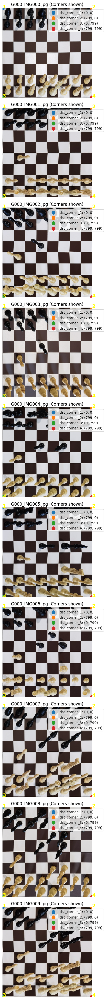

In [33]:
import matplotlib.pyplot as plt

def plot_warped_results(warped_results, max_images=10):
    plt.figure(figsize=(16, 4 * min(max_images, len(warped_results))))
    for idx, (fname, result) in enumerate(list(warped_results.items())[:max_images]):
        img = result['warped_image']
        src_corners = result['src_corners']
        dst_corners = result['dst_corners']

        plt.subplot(min(max_images, len(warped_results)), 1, idx + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{fname} (Corners shown)")
        
        # Draw destination corners on the warped image
        for i, (x, y) in enumerate(dst_corners):
            plt.scatter([x], [y], s=100, label=f"dst_corner_{i+1}: ({int(x)}, {int(y)})")
            plt.text(x, y, f"{i+1}", color='yellow', fontsize=14, fontweight='bold')
        
        plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
        plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_warped_results(warped_results)

In [34]:
for fname in warped_results.keys():
    warped_results = process_image(fname, warped_results)


Filling missing lines: 4 found, 7 expected
Filling missing lines: 5 found, 7 expected
Filling missing lines: 6 found, 7 expected
Filling missing lines: 6 found, 7 expected
Filling missing lines: 6 found, 7 expected
Filling missing lines: 6 found, 7 expected
Filling missing lines: 4 found, 7 expected
Insufficient grid lines detected: 9 horizontal, 7 vertical
Falling back to equally spaced grid lines
Filling missing lines: 5 found, 7 expected
Filling missing lines: 4 found, 7 expected
Filling missing lines: 6 found, 7 expected
Filling missing lines: 5 found, 7 expected
Filling missing lines: 6 found, 7 expected
Insufficient grid lines detected: 8 horizontal, 7 vertical
Falling back to equally spaced grid lines
Filling missing lines: 6 found, 7 expected
Filling missing lines: 6 found, 7 expected
Insufficient grid lines detected: 8 horizontal, 7 vertical
Falling back to equally spaced grid lines
Filling missing lines: 5 found, 7 expected
Filling missing lines: 6 found, 7 expected
Filling m

In [35]:
import json
from pathlib import Path

json_path = Path("../Shared/annotations.json")  # Update if needed

with open(json_path, 'r') as f:
    data = json.load(f)

# Load chessred2k split image IDs
chessred2k_splits = {}
for split in ['train', 'val', 'test']:
    chessred2k_splits[split] = data['splits']['chessred2k'][split]['image_ids']

print({k: len(v) for k, v in chessred2k_splits.items()})


{'train': 1442, 'val': 330, 'test': 306}


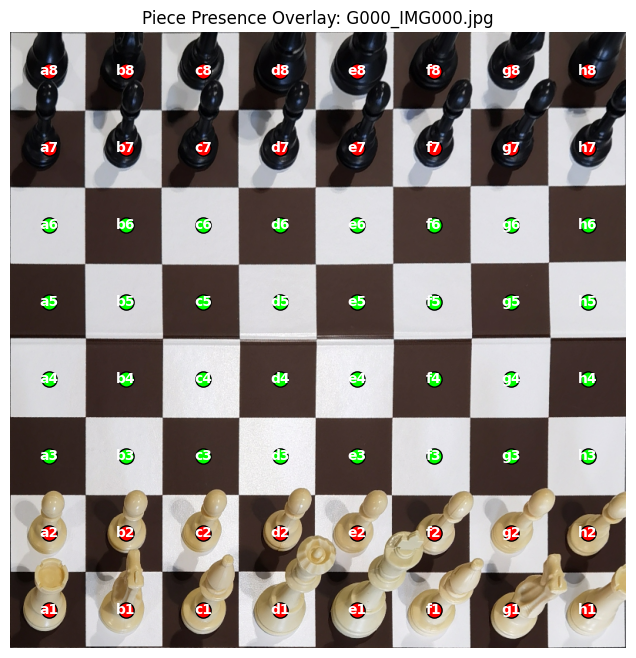

In [36]:
def visualize_piece_presence(warped_results, training_data, idx=0):
    """
    Visualize the squares and overlay whether a piece is present based on the presence matrix.
    """
    entry = training_data[idx]
    fname = entry['file_name']
    presence_matrix = entry['presence_matrix']
    squares = warped_results[fname]['squares']
    img = warped_results[fname]['warped_image'].copy()

    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    for square in squares:
        i, j = square['position']
        x1, y1, x2, y2 = square['image'].shape[1], square['image'].shape[0], 0, 0
        # Get bounds from square_centers or square_bounds if available
        if 'center' in square:
            cx, cy = square['center']
        elif 'bounds' in square:
            x1, y1, x2, y2 = square['bounds']
            cx, cy = (x1 + x2) // 2, (y1 + y2) // 2
        else:
            # fallback: estimate center
            cx, cy = (j + 0.5) * img.shape[1] // 8, (i + 0.5) * img.shape[0] // 8

        has_piece = presence_matrix[i][j]
        color = 'red' if has_piece else 'lime'
        plt.scatter([cx], [cy], c=color, s=120, marker='o', edgecolors='black')
        plt.text(cx, cy, square['label'], color='white', fontsize=10, ha='center', va='center', fontweight='bold')
    plt.title(f"Piece Presence Overlay: {fname}")
    plt.axis('off')
    plt.show()

# Example usage: visualize the first entry
visualize_piece_presence(warped_results, training_data, idx=0)

In [37]:
import cv2
from pathlib import Path

base_output_dir = Path("./split_by_presence")

for split in ['train', 'val', 'test']:
    print(f"\nProcessing split: {split}")
    image_ids = set(chessred2k_splits[split])
    print(f"  Number of image_ids in split: {len(image_ids)}")
    # print image_ids for debugging
    print(f"  Image IDs: {list(image_ids)[:5]}... (total {len(image_ids)})")
    count_images = 0
    count_squares = 0
    for entry in training_data:
        fname = entry['file_name']
        image_id = entry["image_id"]
        #print(f"  Checking file: {fname}")
        if image_id not in image_ids:
            continue
        count_images += 1
        presence_matrix = entry['presence_matrix']
        squares = warped_results[fname]['squares']
        print(f"    Processing image: {fname}, squares: {len(squares)}")
        for square in squares:
            i, j = square['position']
            label = str(presence_matrix[i][j])
            out_dir = base_output_dir / split / label
            out_dir.mkdir(parents=True, exist_ok=True)
            out_name = f"{fname.replace('.jpg','')}_{square['label']}.jpg"
            out_path = out_dir / out_name
            print(f"      Saving square {square['label']} at position ({i},{j}) with label {label} to {out_path}")
            cv2.imwrite(str(out_path), square['image'])
            count_squares += 1
    print(f"  Finished split '{split}': {count_images} images, {count_squares} squares saved.")
print("Saved all squares to split_by_presence directories.")



Processing split: train
  Number of image_ids in split: 1442
  Image IDs: [8580, 8581, 8582, 8583, 8584]... (total 1442)
    Processing image: G019_IMG000.jpg, squares: 64
      Saving square a8 at position (0,0) with label 1 to split_by_presence\train\1\G019_IMG000_a8.jpg
      Saving square b8 at position (0,1) with label 1 to split_by_presence\train\1\G019_IMG000_b8.jpg
      Saving square c8 at position (0,2) with label 1 to split_by_presence\train\1\G019_IMG000_c8.jpg
      Saving square d8 at position (0,3) with label 1 to split_by_presence\train\1\G019_IMG000_d8.jpg
      Saving square e8 at position (0,4) with label 1 to split_by_presence\train\1\G019_IMG000_e8.jpg
      Saving square f8 at position (0,5) with label 1 to split_by_presence\train\1\G019_IMG000_f8.jpg
      Saving square g8 at position (0,6) with label 1 to split_by_presence\train\1\G019_IMG000_g8.jpg
      Saving square h8 at position (0,7) with label 1 to split_by_presence\train\1\G019_IMG000_h8.jpg
      Savin